In [1]:
import numpy as np
import scipy

import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output, display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) # just making the notebook cells wider

from importlib import reload
import time

import warnings
warnings.filterwarnings("ignore")

import poppy
import hcipy as hci

import wfsc_tests as wfsc

wfsc.math_module.update_np(np)
wfsc.math_module.update_scipy(scipy)

# iefc_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data')
iefc_dir = Path('/home/kianmilani/Projects/roman-cgi-iefc-data')

import misc_funs as misc

import hcipy_models as hcim
reload(hcim)

reload(hci)
npix = 256
oversample = 2
c = hcim.SVC(npix=npix, oversample=oversample)



In [2]:
c.pupil_grid.shape, c.pupil_grid.delta, c.pupil_grid.shape*c.pupil_grid.delta



(array([512, 512]), array([0.02539062, 0.02539062]), array([13., 13.]))

In [2]:
influence_functions = hci.make_gaussian_influence_functions(c.pupil_grid, c.Nact, c.actuator_spacing)


34 952


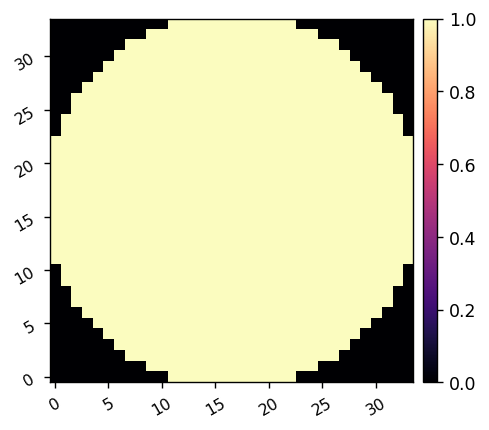

In [11]:
reload(hcim)
c = hcim.SVC(npix=npix, oversample=oversample,
             influence_functions=influence_functions,
             psf_pixelscale_lamD=1/4,
             dm1_dm2=1000*u.mm,
             aberration_distance=1000e-3*u.m)

print(c.Nact, c.Nacts)
wfsc.imshow1(c.dm_mask)

wf = hci.Wavefront(c.aperture, c.wavelength.to_value(u.m))
pupil_mask = wf.amplitude.shaped
wf = c.wfe_at_distance(wf)
# wf = c.aperture(wf)

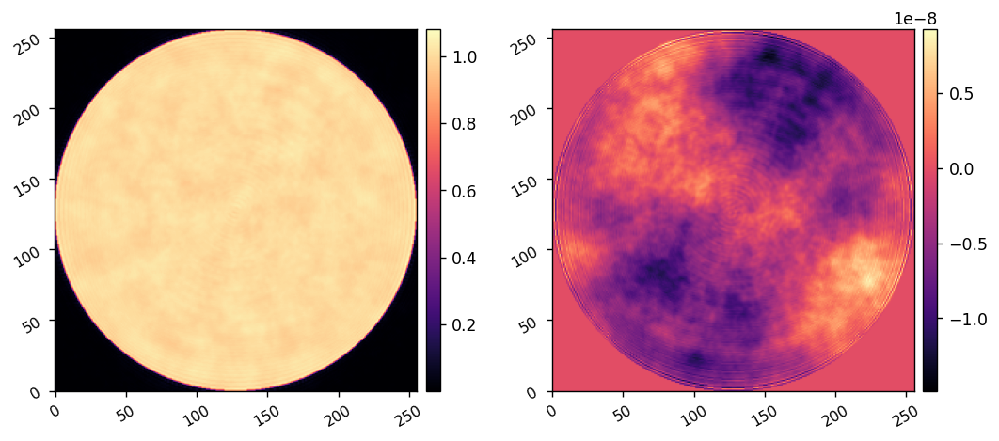

In [12]:
# pupil_mask = 
wfsc.imshow3(wf.amplitude.shaped, wf.phase.shaped*c.wavelength.to_value(u.m)/(2*np.pi)*pupil_mask, npix=c.npix)

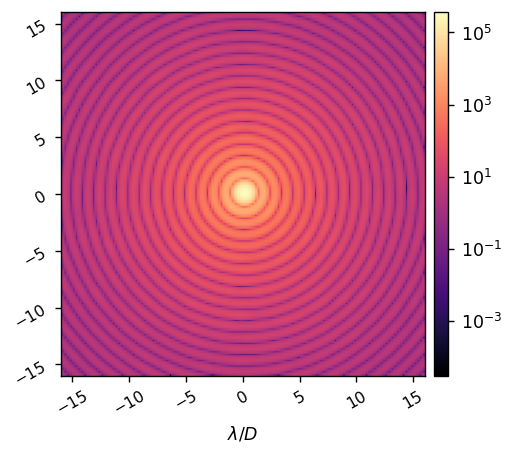

Field(363630.8118918)

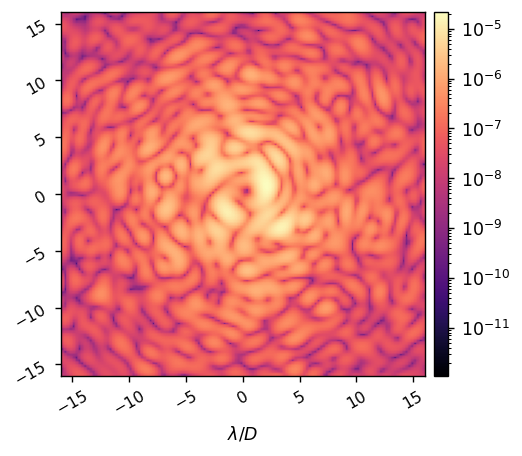

In [13]:
c.use_fpm = False
c.norm = 1
ref_unocc_im = c.snap()
wfsc.imshows.imshow1(ref_unocc_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

max_ref = ref_unocc_im.max()
display(max_ref)

c.use_fpm = True
c.norm = max_ref # divide the source flux to get nominal contrast images
ref_im = c.snap()
wfsc.imshow1(ref_im, pxscl=c.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

# define the dark hole region

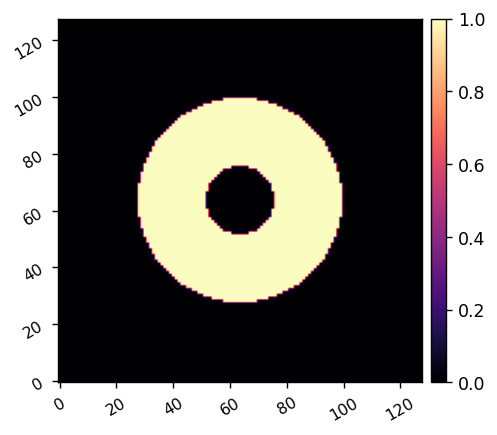

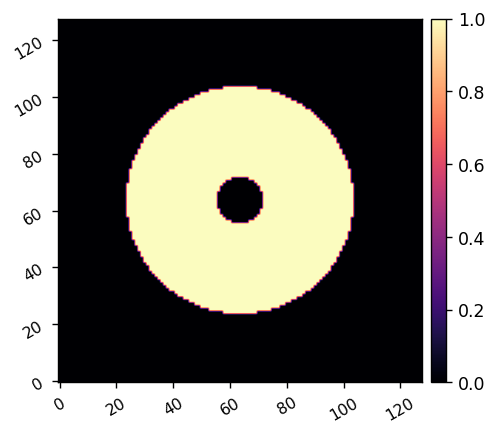

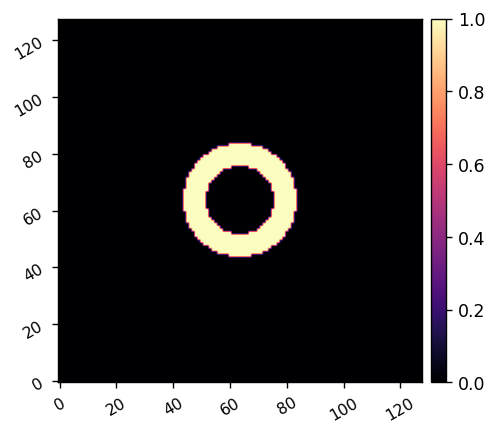

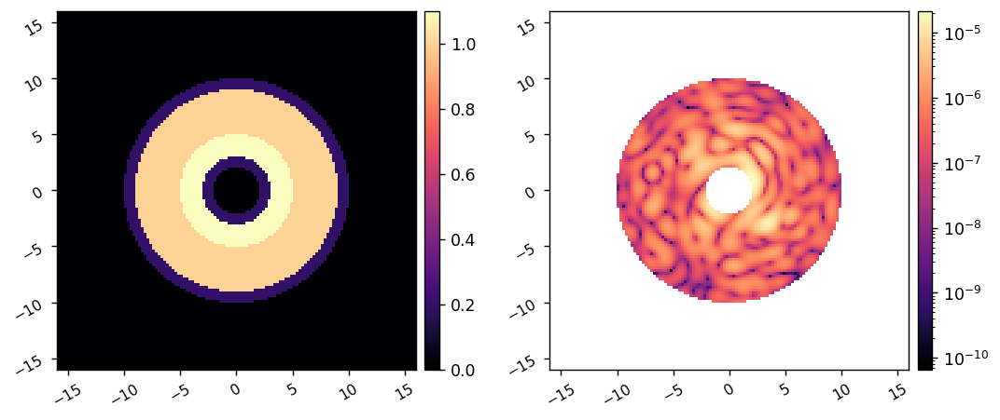

In [14]:
reload(wfsc)
reload(wfsc.utils)
reload(wfsc.imshows)

npsf = c.npsf

xfp = (np.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*c.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)

iwa = 3
owa = 9
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2.5,
        'rotation':0,
        'full':True,
    }
roi1 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = (3-1)
owa = (9+1)
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi2 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


iwa = 3
owa = 5
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi3 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


# wfsc.imshow2(roi1, roi2)
weight_map = roi1 + 0.2*(roi2 * ~roi1) + 0.1*roi3
control_mask = weight_map>0
wfsc.imshow2(weight_map, control_mask*ref_im, lognorm2=True, pxscl=c.psf_pixelscale_lamD)


(320, 1156)

(160, 2)

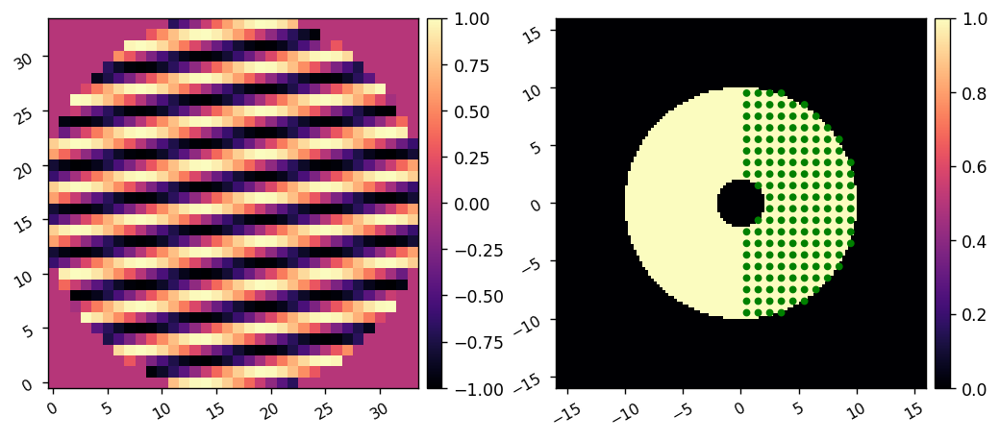

In [35]:
reload(wfsc.utils)
calib_modes, fs = wfsc.utils.select_fourier_modes(c, control_mask*(fpx>0), fourier_sampling=1) 
nmodes = calib_modes.shape[0]
nf = calib_modes.shape[0]//2
display(calib_modes.shape, fs.shape)



patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))

wfsc.imshow2(calib_modes[5].reshape(c.Nact,c.Nact), control_mask, 
             patches2=patches, pxscl2=c.psf_pixelscale_lamD)
# wfsc.imshow1(ref_im, lognorm=True, pxscl=c.psf_pixelscale_lamD, patches=patches)


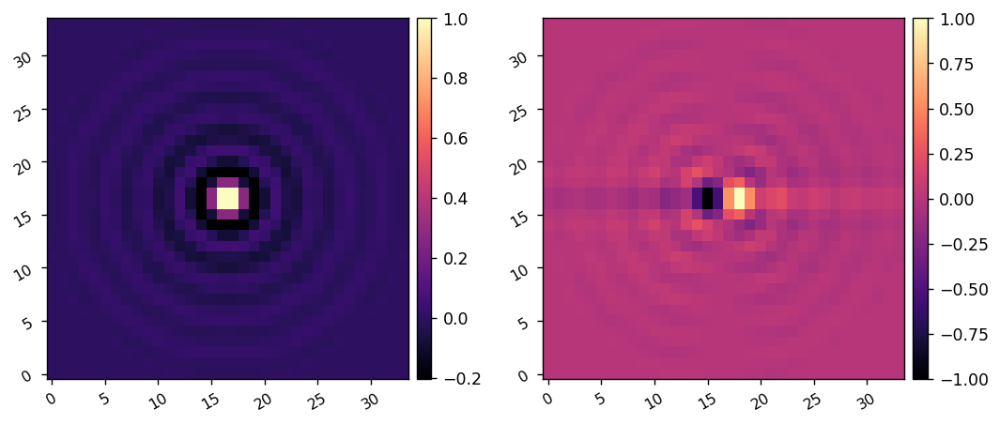

In [67]:
reload(wfsc.utils)
probe_amp = 2.5e-8
fourier_modes, fs = wfsc.utils.select_fourier_modes(c, control_mask*(fpx>0), fourier_sampling=0.5) 
probe_modes = wfsc.utils.create_fourier_probes(fourier_modes, Nact=c.Nact, plot=True)
# probe_modes = np.append(probe_modes, probe_modes[1], axis=0)
# probe_modes = np.array([probe_modes[1], np.rot90(probe_modes[1])])
# wfsc.imshow2(probe_modes[0], probe_modes[1])

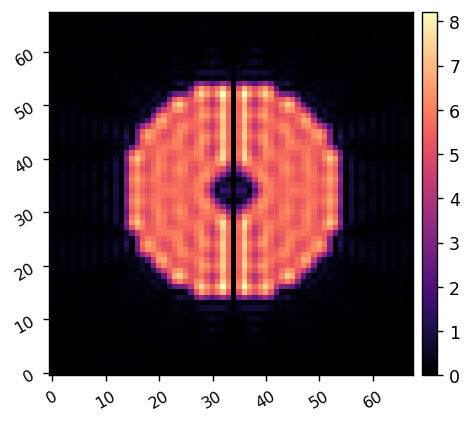

In [59]:
probe_response = np.abs(np.fft.fftshift(np.fft.fft2(np.fft.fftshift(wfsc.utils.pad_or_crop(probe_modes[1], 2*probe_modes[0].shape[0])))))
wfsc.imshow1(probe_response)

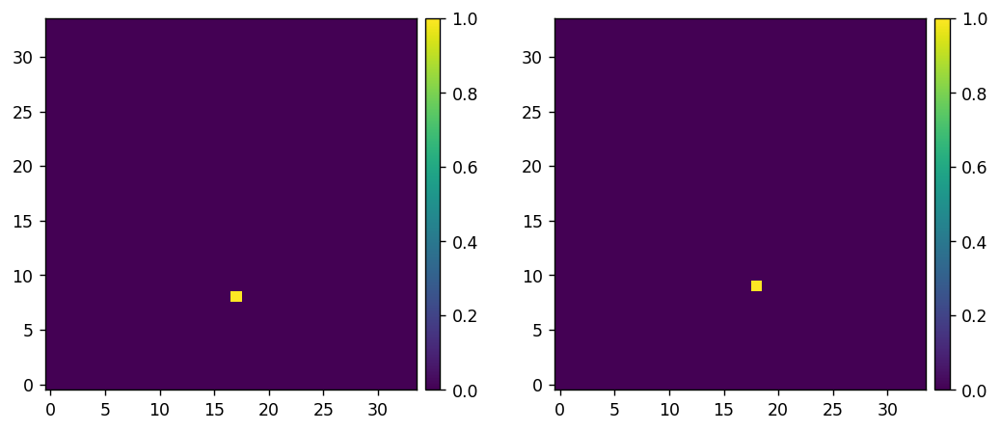

In [16]:
probe_modes = wfsc.utils.create_probe_poke_modes(poke_indices=[(c.Nact//2, c.Nact//4), (c.Nact//2+1, c.Nact//4+1)], Nact=c.Nact, plot=True)

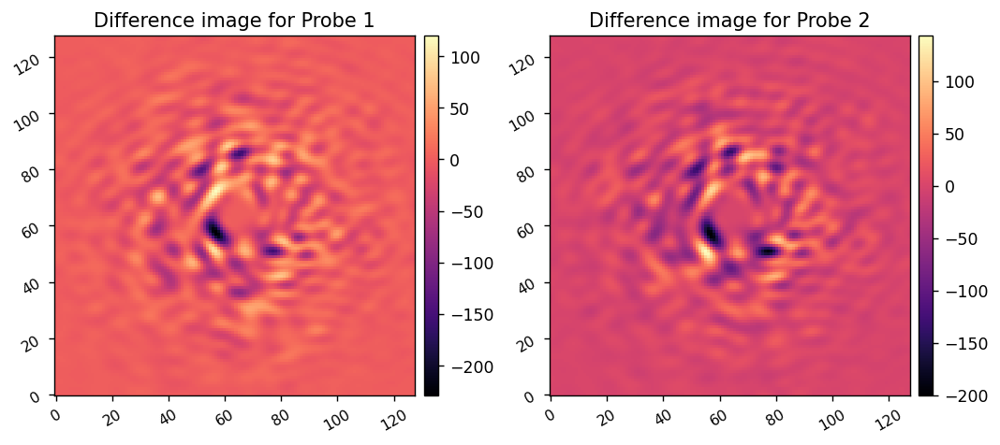

In [17]:
reload(wfsc.iefc_2dm)

probe_amp = 2.5e-8
calib_amp = 5e-9

# c.texp = 1

c.reset_dms()

differential_images, single_images = wfsc.iefc_2dm.take_measurement(c, 
                                                                   probe_modes, probe_amp, 
                                                                   return_all=True)
ims = differential_images.reshape(probe_modes.shape[0], c.npsf, c.npsf)
wfsc.imshow2(ims[0], ims[1], 'Difference image for Probe 1', 'Difference image for Probe 2')

In [18]:
reload(wfsc.iefc_2dm)
response_matrix, response_cube = wfsc.iefc_2dm.calibrate(c, 
                                                         control_mask.ravel(),
                                                         probe_amp, probe_modes, 
                                                         calib_amp, calib_modes, 
                                                         return_all=True)

Calibrating iEFC...
	Calibrated mode 320/320 in 3517.353s
Calibration complete.


In [ ]:
from datetime import datetime
date = int(datetime.today().strftime('%Y%m%d'))


In [20]:

date = 20230714

misc.save_fits(iefc_dir/'response-data'/f'hcipy_svc_iefc_2dm_response_matrix_{date}.fits', response_matrix)
misc.save_fits(iefc_dir/'response-data'/f'hcipy_svc_iefc_2dm_response_cube_{date}.fits', response_cube)

Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/hcipy_svc_iefc_2dm_response_matrix_20230714.fits
Saved data to:  /home/kianmilani/Projects/roman-cgi-iefc-data/response-data/hcipy_svc_iefc_2dm_response_cube_20230714.fits


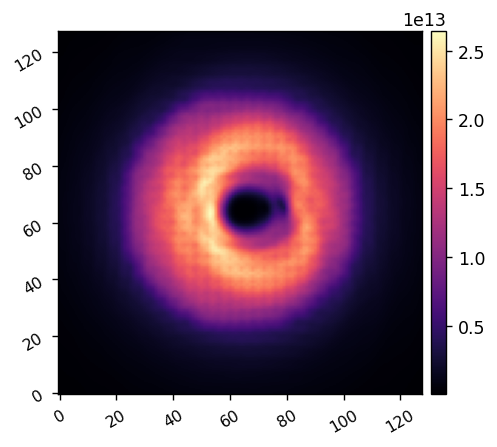

In [21]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.imshow1(response_sum.reshape(c.npsf,c.npsf))

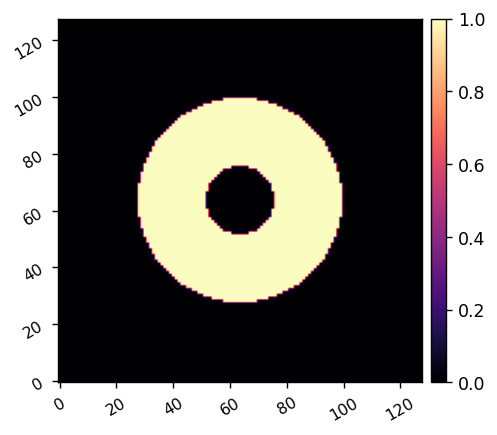

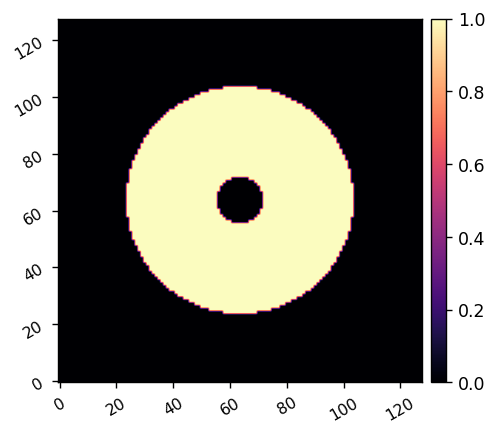

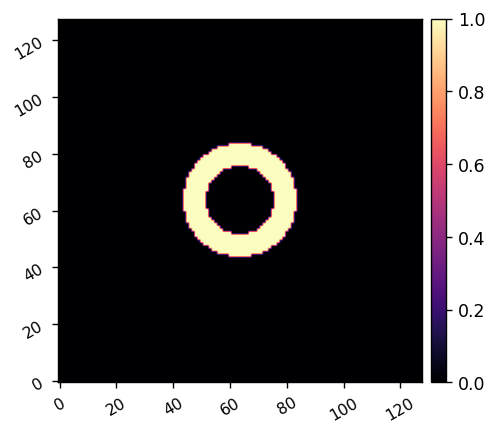

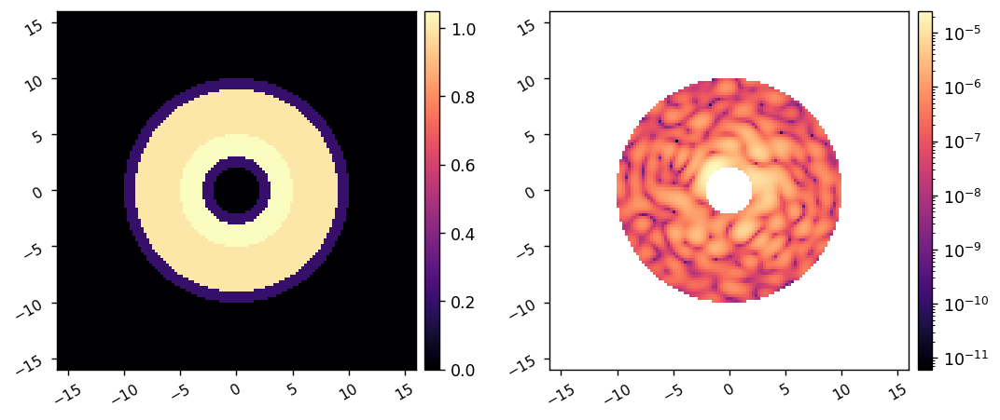

In [73]:
xfp = (np.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*c.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)

iwa = 3
owa = 9
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2.5,
        'rotation':0,
        'full':True,
    }
roi1 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = (3-1)
owa = (9+1)
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi2 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


iwa = 3
owa = 5
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi3 = wfsc.utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)


# wfsc.imshow2(roi1, roi2)
weight_map = roi1 + 0.2*(roi2 * ~roi1) + 0.05*roi3
control_mask = weight_map>0
wfsc.imshow2(weight_map, control_mask*ref_im, lognorm2=True, pxscl=c.psf_pixelscale_lamD)


(9632, 9632) (9632, 640)
Running I-EFC...
	Closed-loop iteration 1 / 10


(640,)

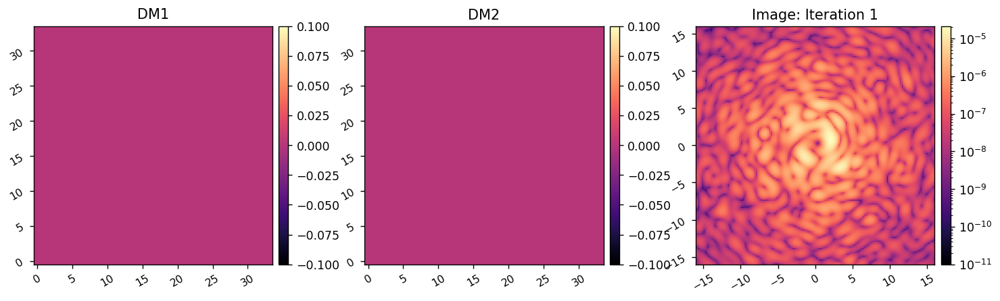

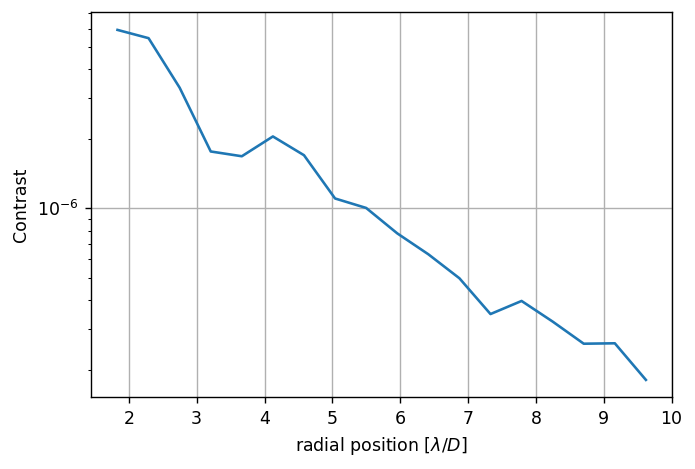

	Closed-loop iteration 2 / 10


(640,)

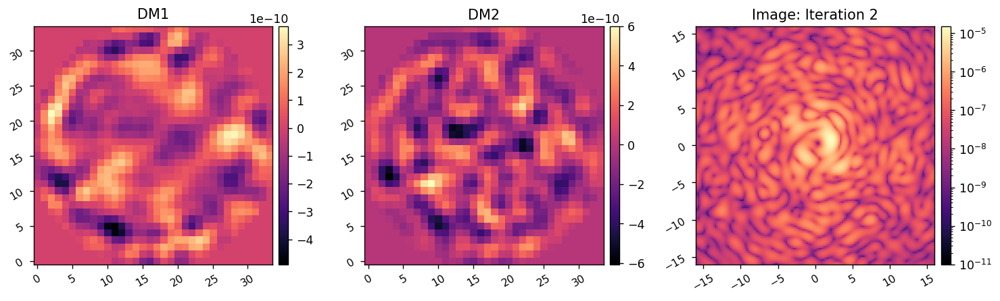

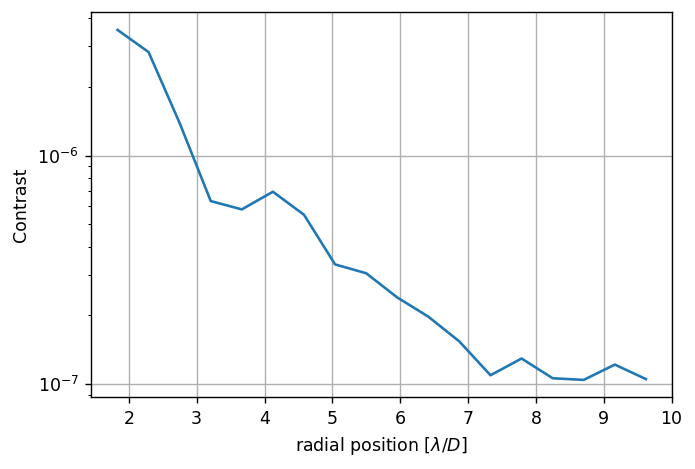

	Closed-loop iteration 3 / 10


(640,)

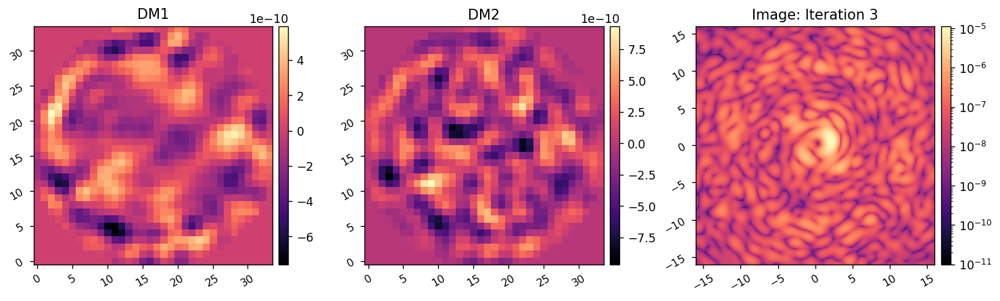

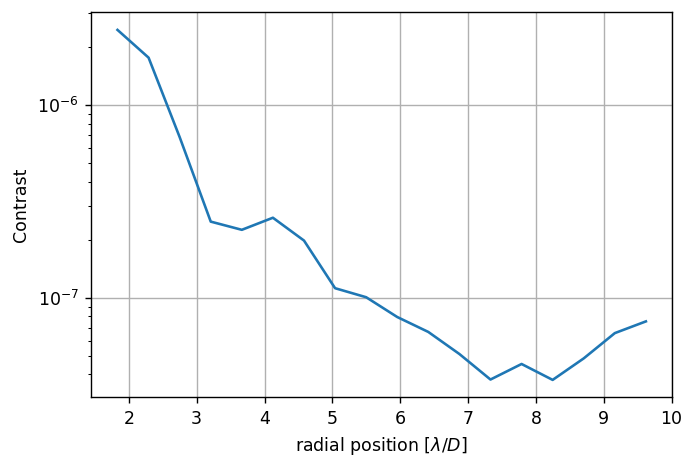

	Closed-loop iteration 4 / 10


(640,)

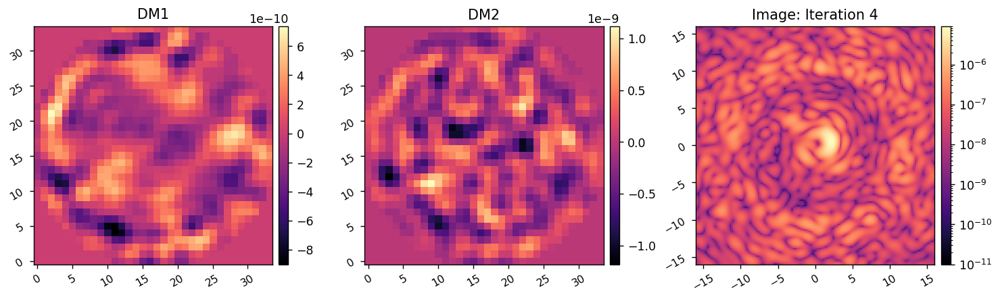

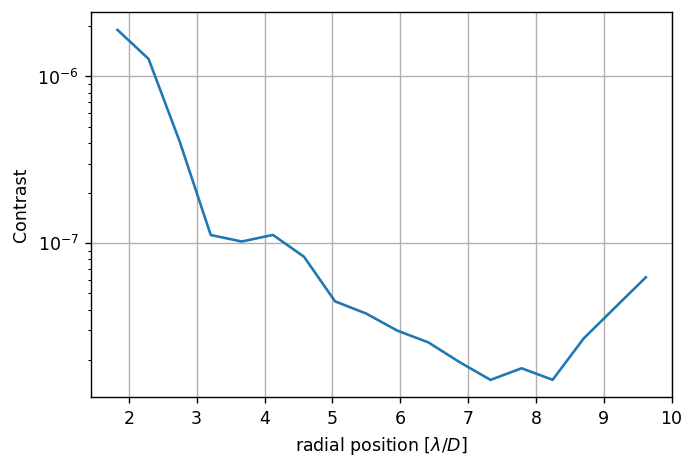

	Closed-loop iteration 5 / 10


(640,)

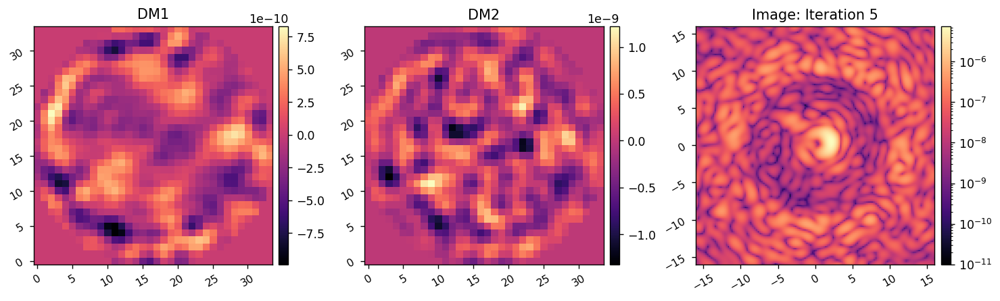

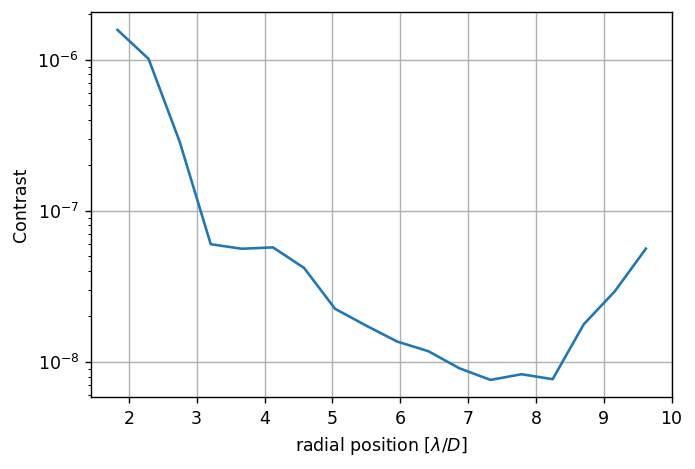

	Closed-loop iteration 6 / 10


(640,)

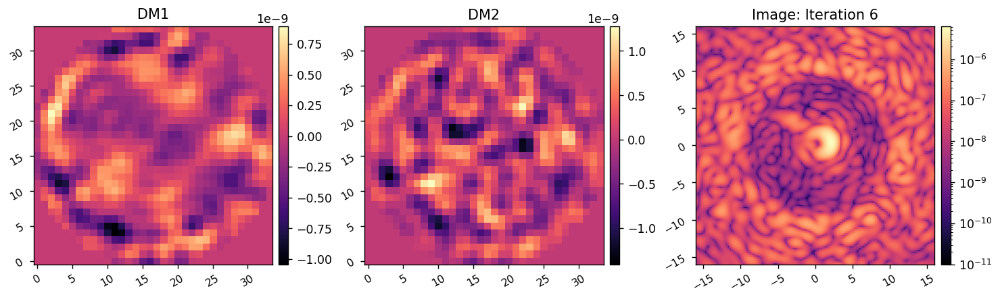

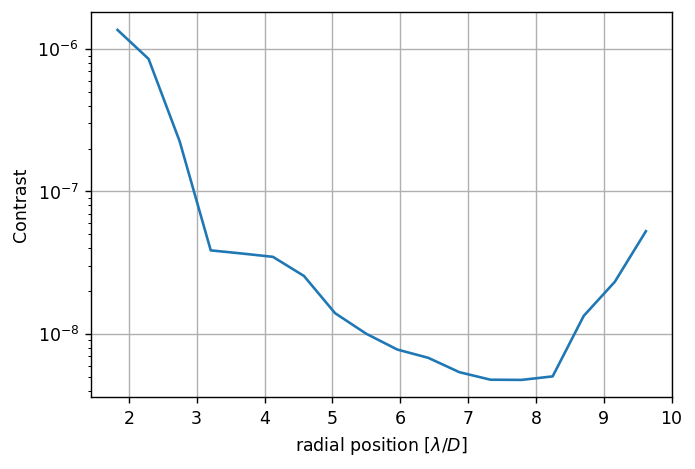

	Closed-loop iteration 7 / 10


(640,)

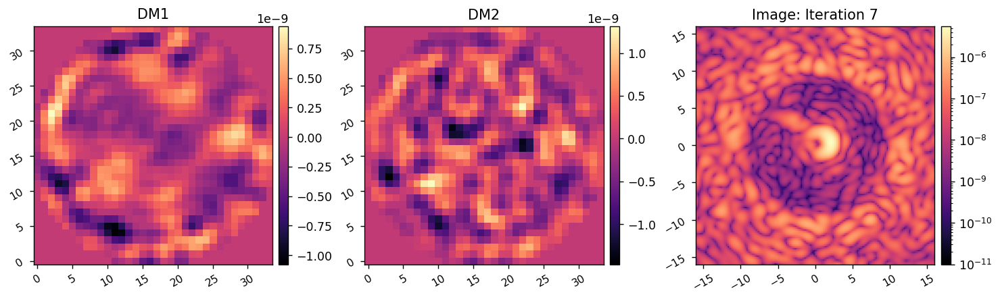

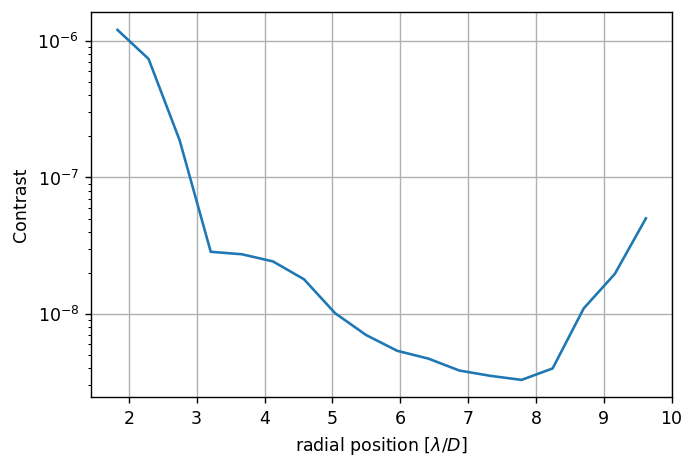

	Closed-loop iteration 8 / 10


(640,)

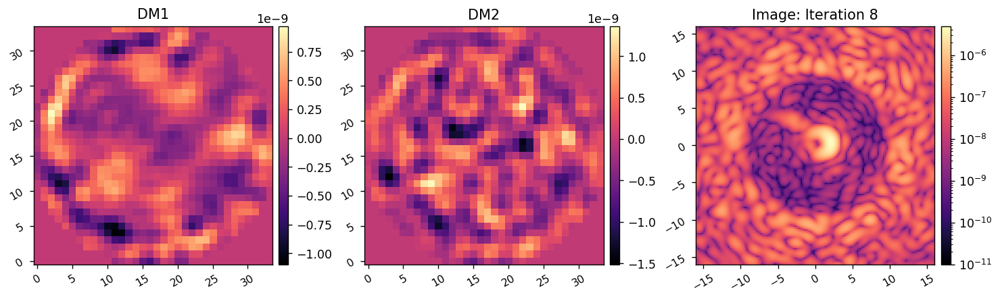

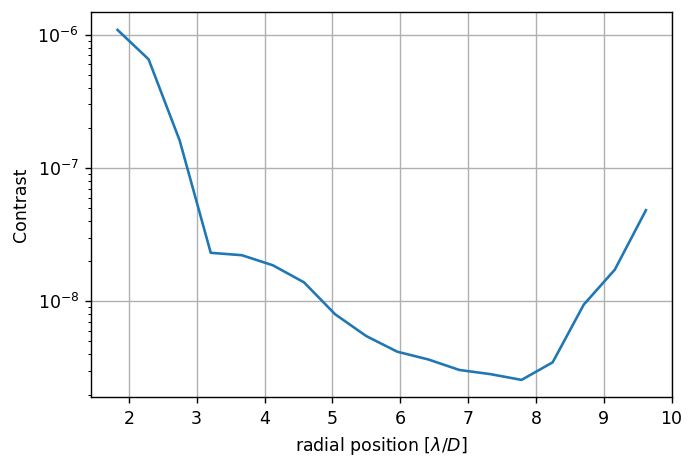

	Closed-loop iteration 9 / 10


(640,)

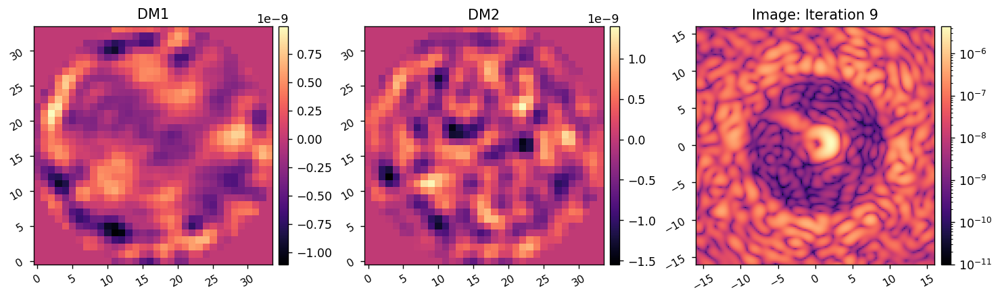

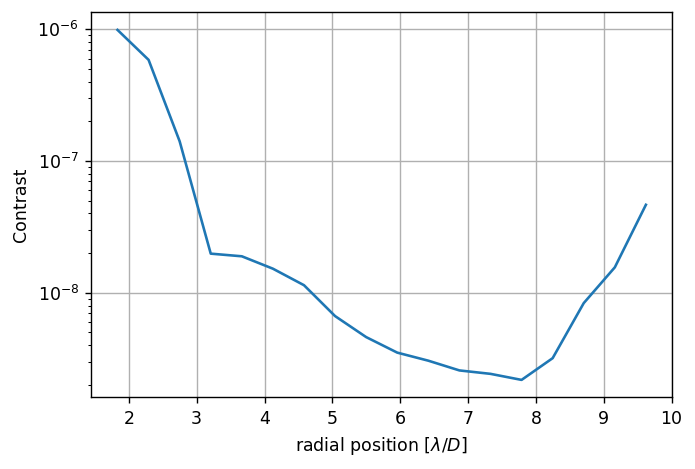

	Closed-loop iteration 10 / 10


(640,)

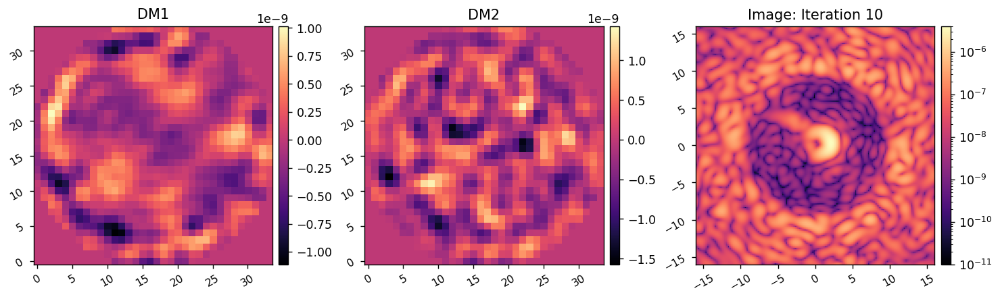

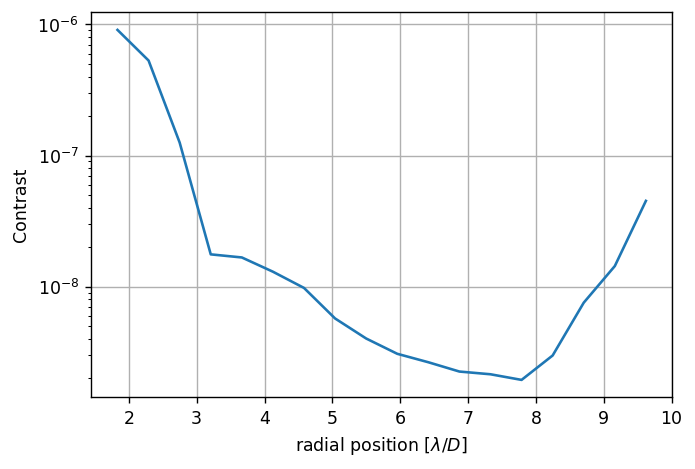

I-EFC loop completed in 43.787s.
(9632, 9632) (9632, 640)
Running I-EFC...
	Closed-loop iteration 1 / 10


(640,)

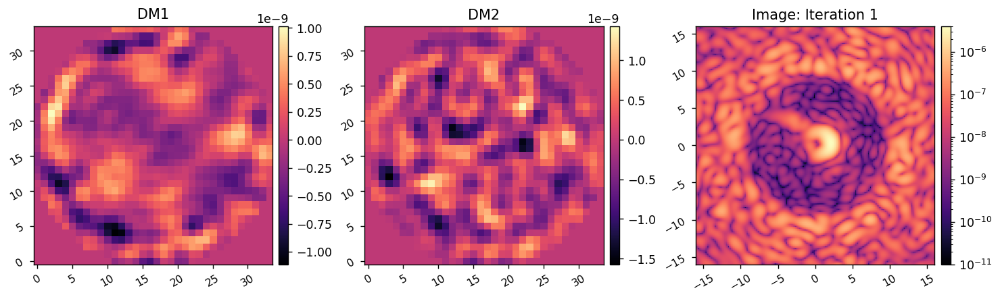

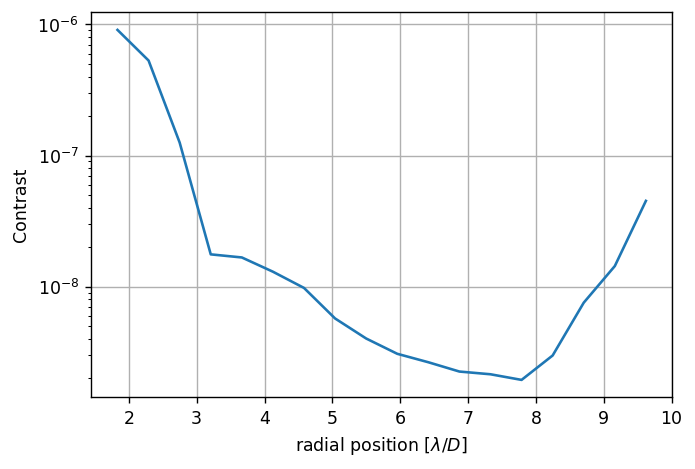

	Closed-loop iteration 2 / 10


(640,)

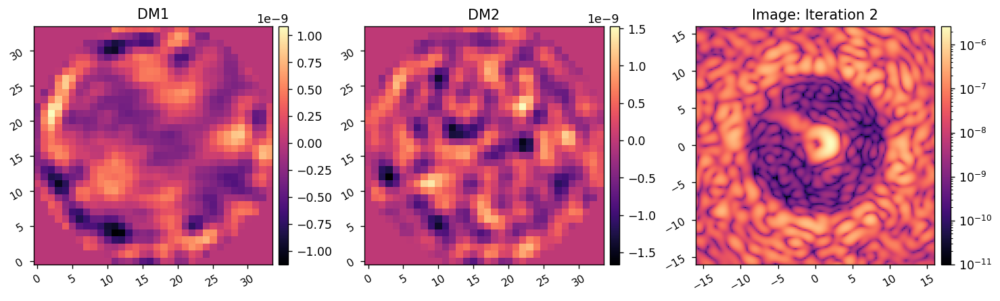

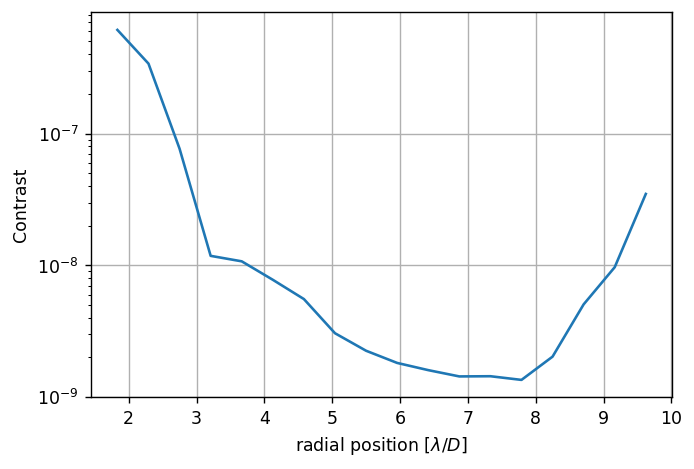

	Closed-loop iteration 3 / 10


(640,)

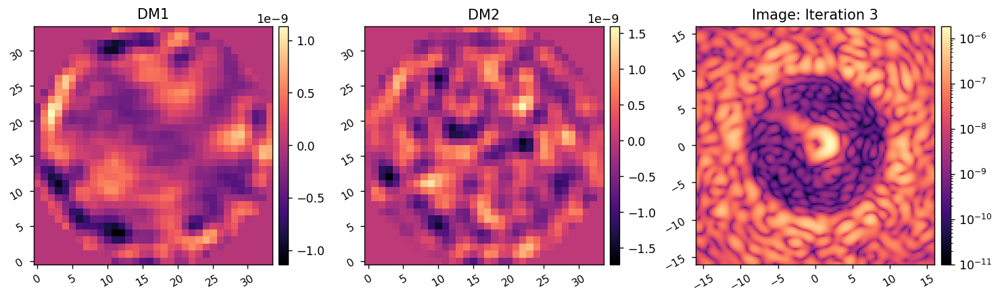

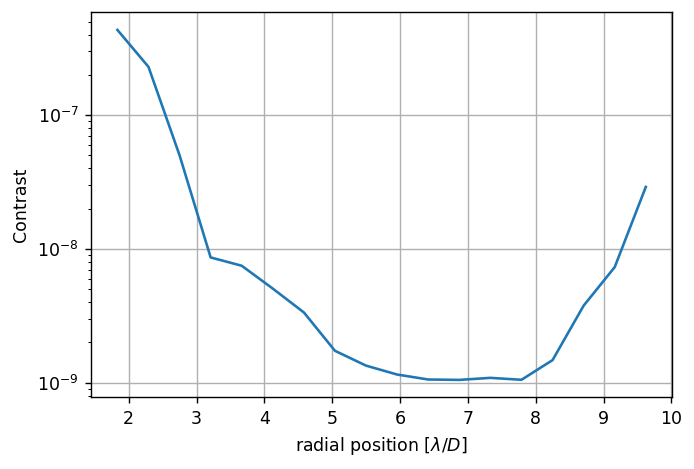

	Closed-loop iteration 4 / 10


(640,)

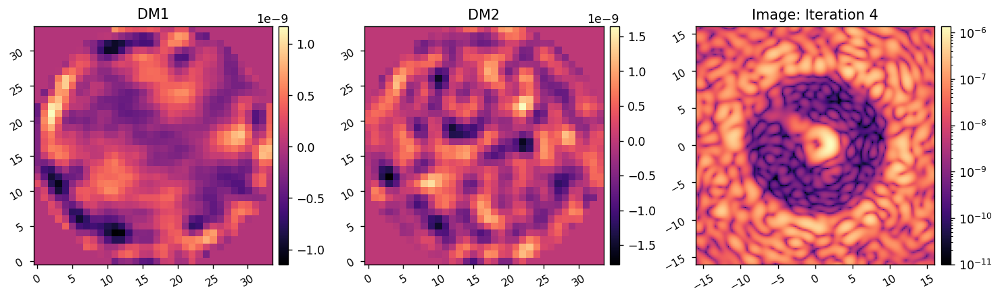

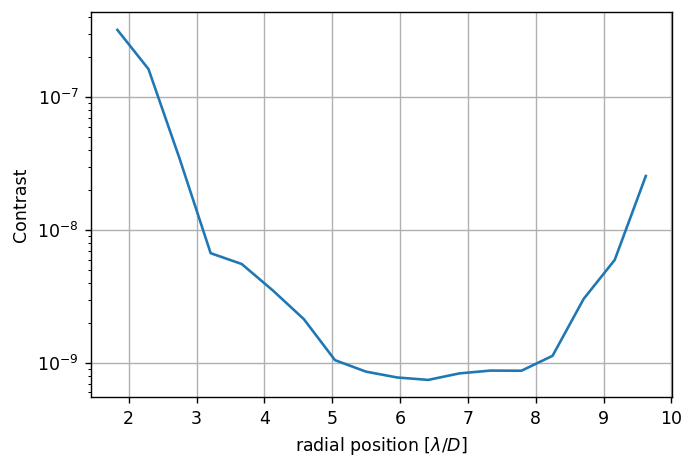

	Closed-loop iteration 5 / 10


(640,)

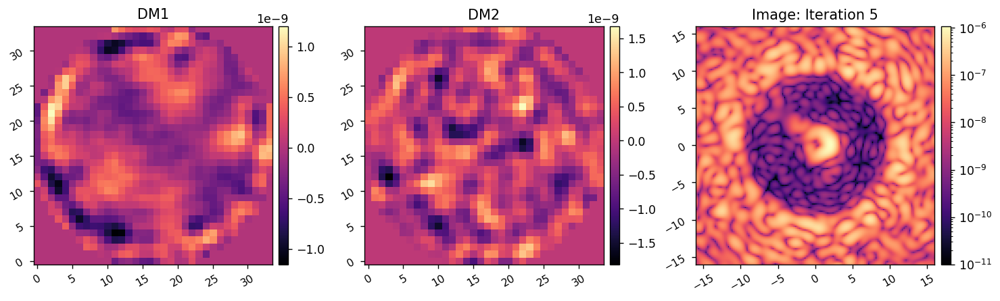

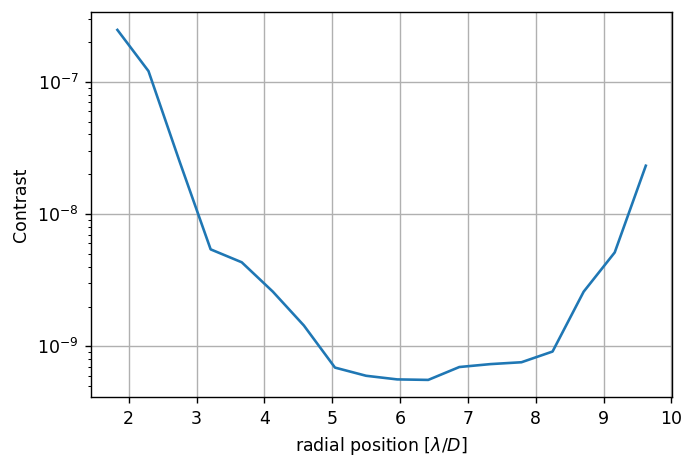

	Closed-loop iteration 6 / 10


(640,)

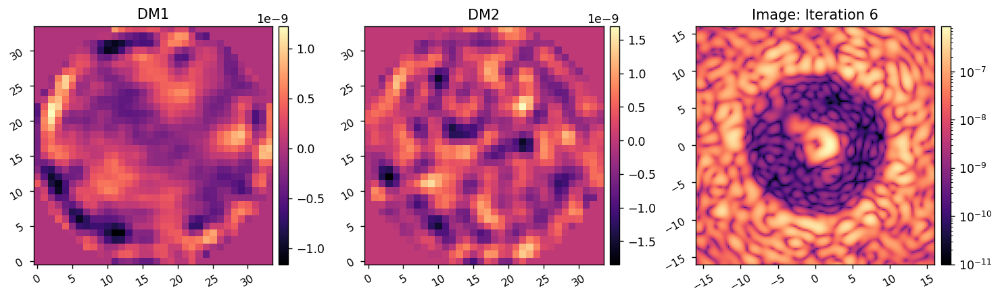

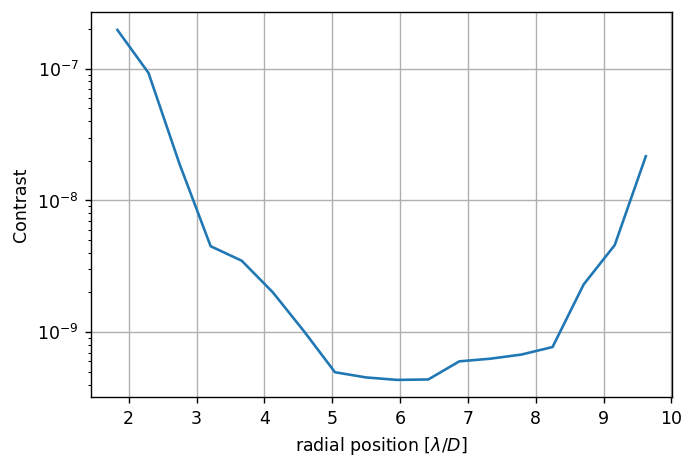

	Closed-loop iteration 7 / 10


(640,)

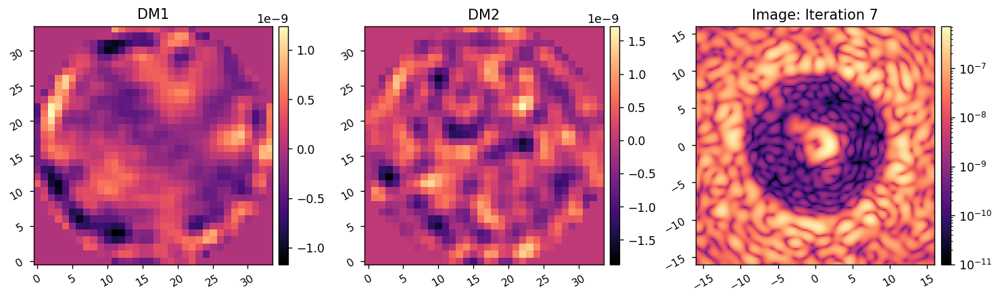

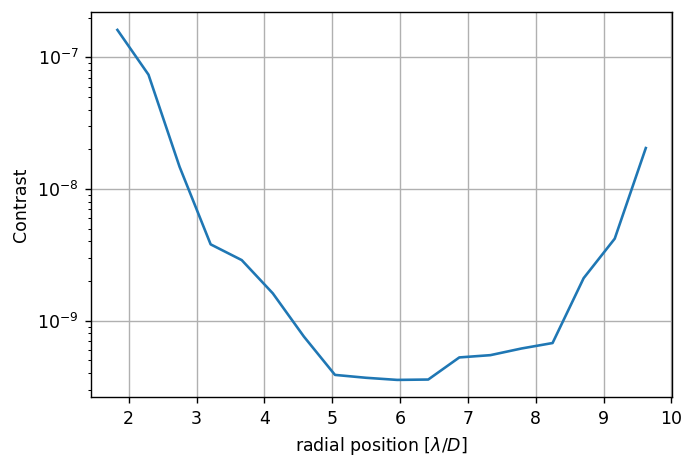

	Closed-loop iteration 8 / 10


(640,)

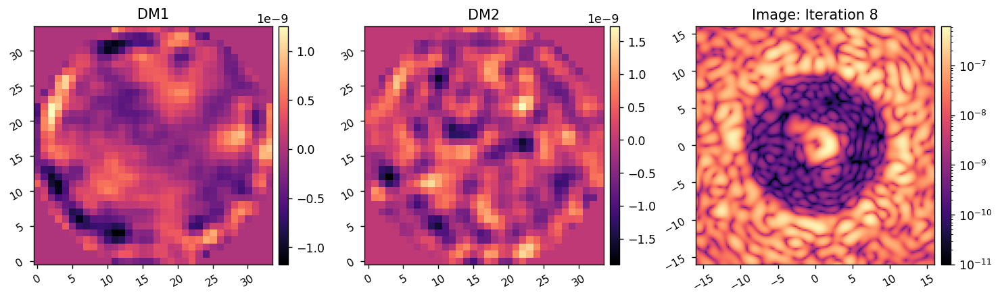

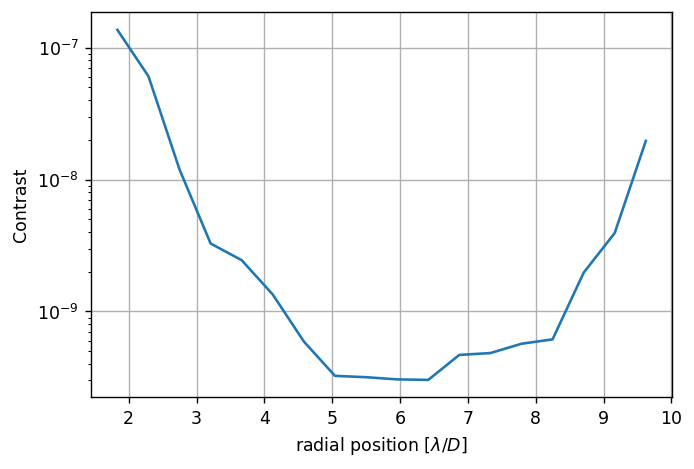

	Closed-loop iteration 9 / 10


(640,)

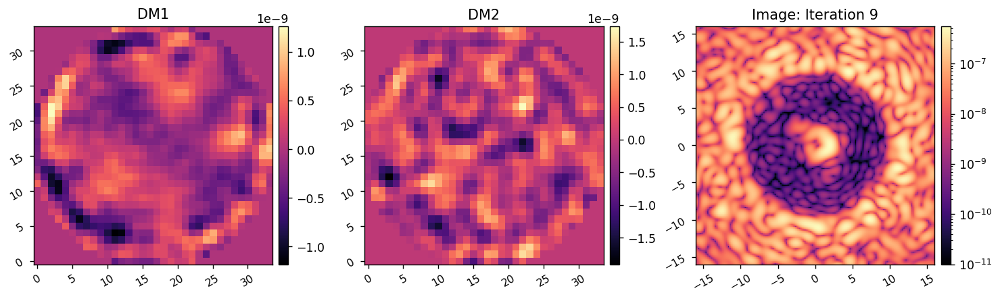

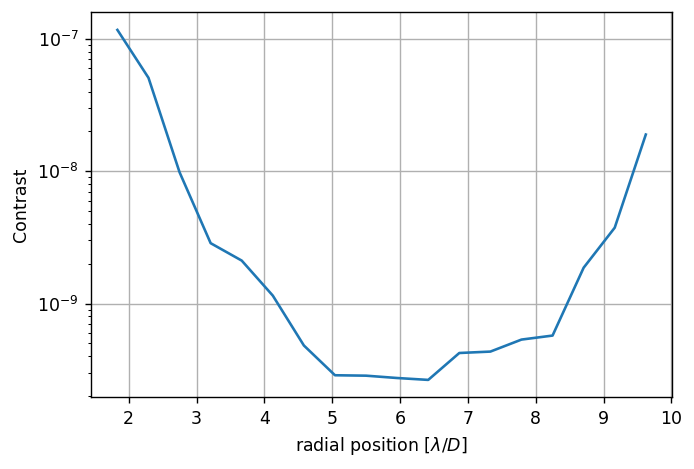

	Closed-loop iteration 10 / 10


(640,)

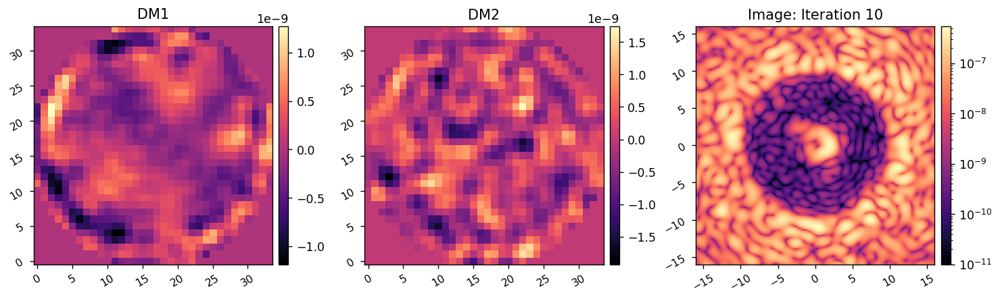

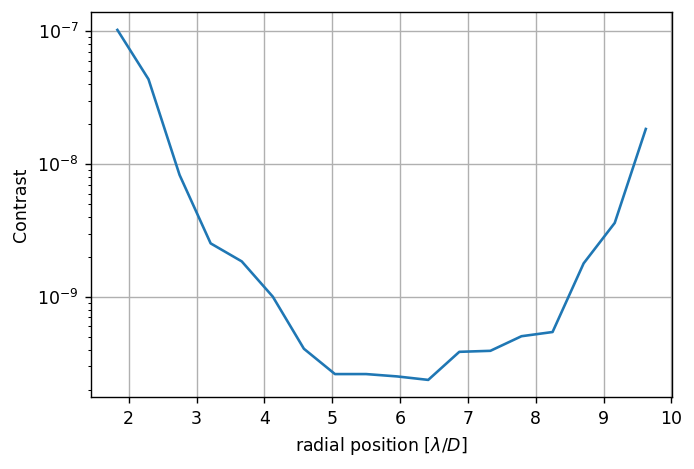

I-EFC loop completed in 43.576s.
(9632, 9632) (9632, 640)
Running I-EFC...
	Closed-loop iteration 1 / 10


(640,)

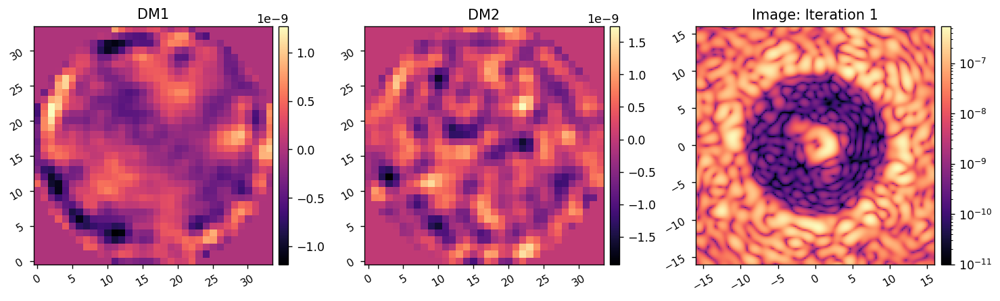

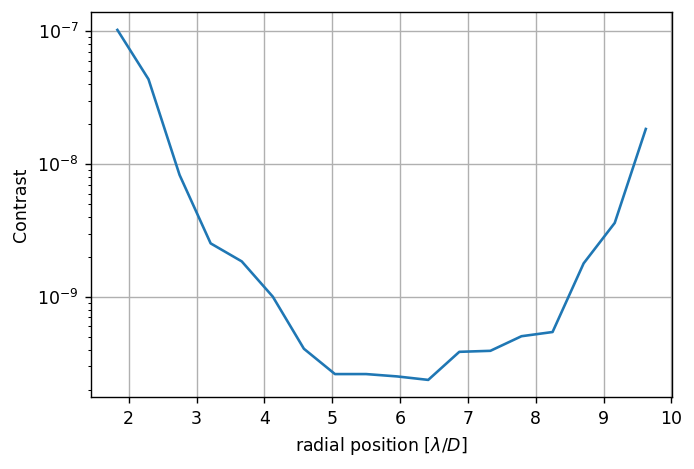

	Closed-loop iteration 2 / 10


(640,)

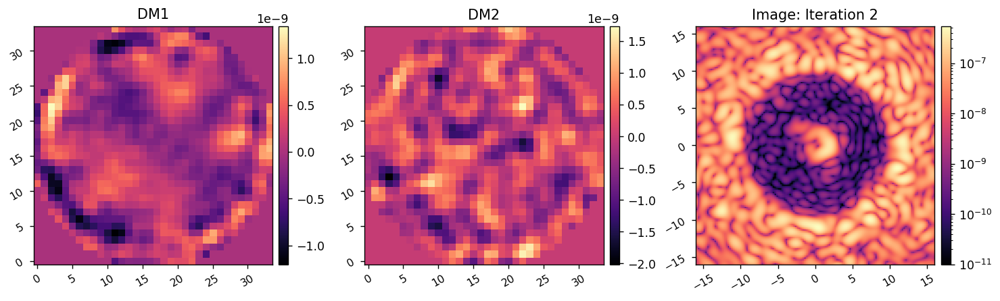

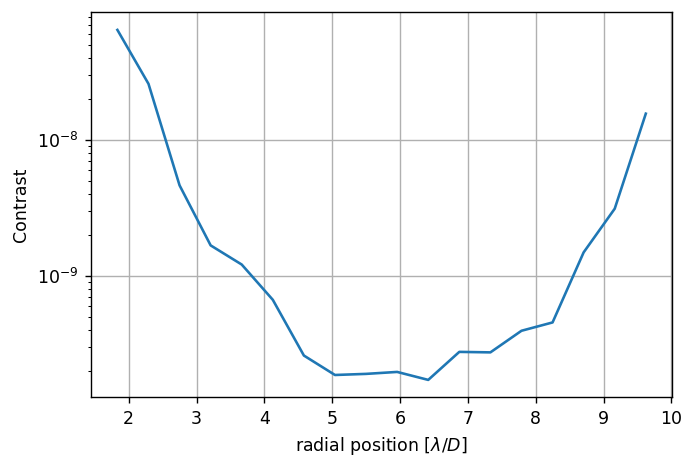

	Closed-loop iteration 3 / 10


(640,)

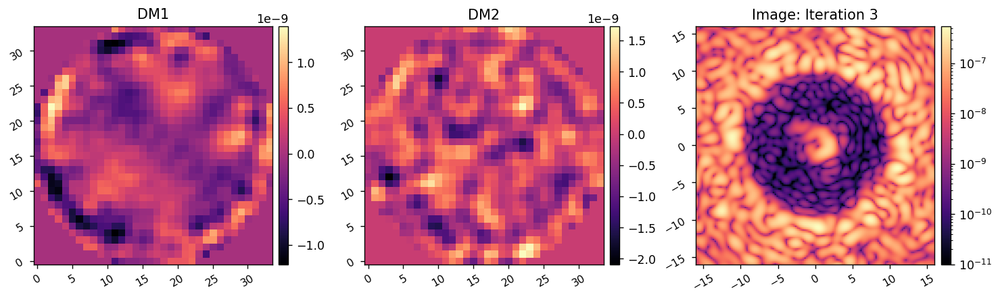

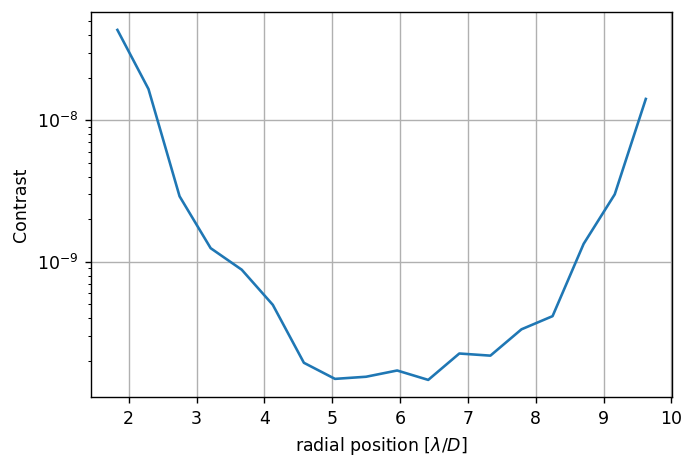

	Closed-loop iteration 4 / 10


(640,)

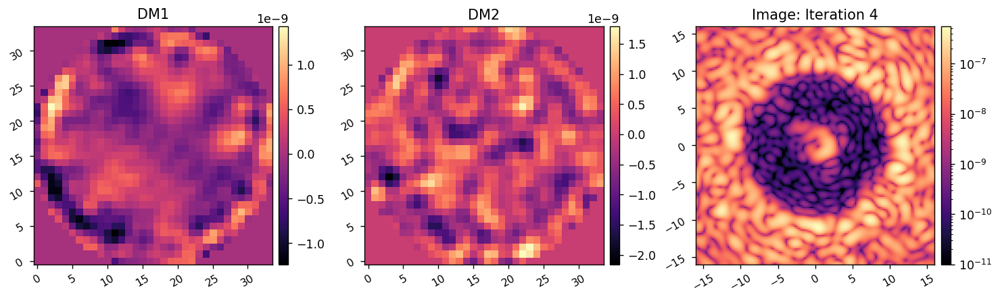

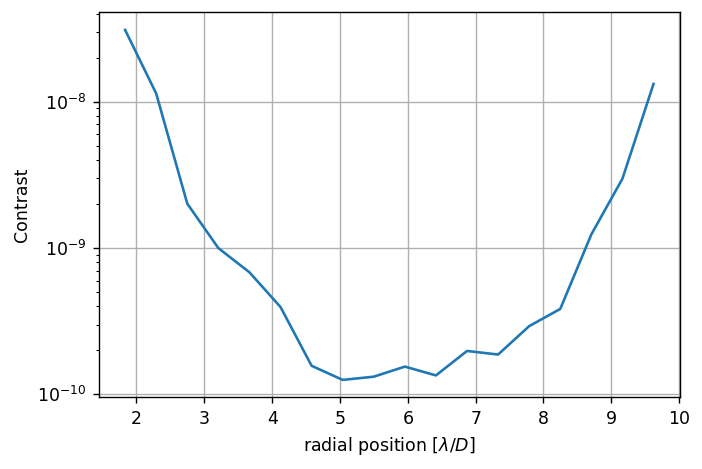

	Closed-loop iteration 5 / 10


(640,)

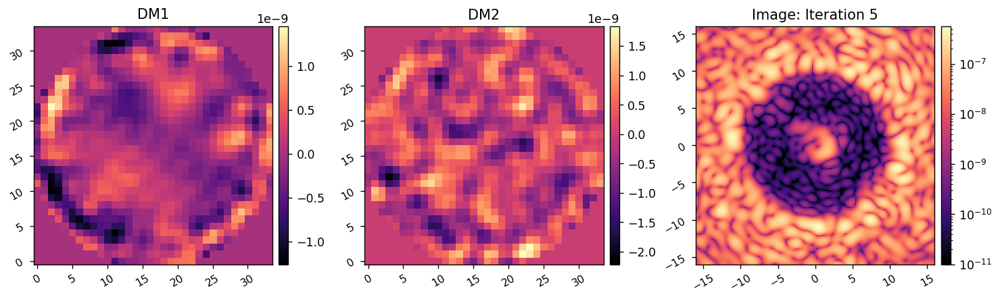

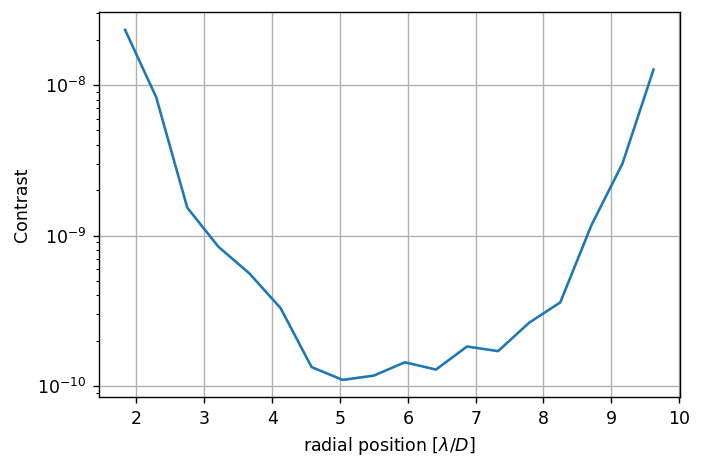

	Closed-loop iteration 6 / 10


(640,)

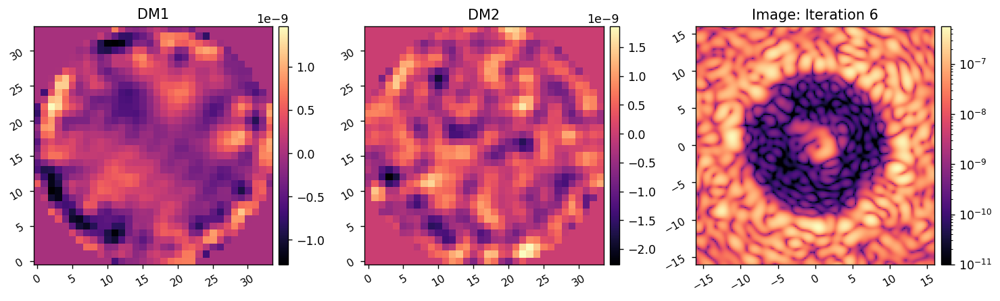

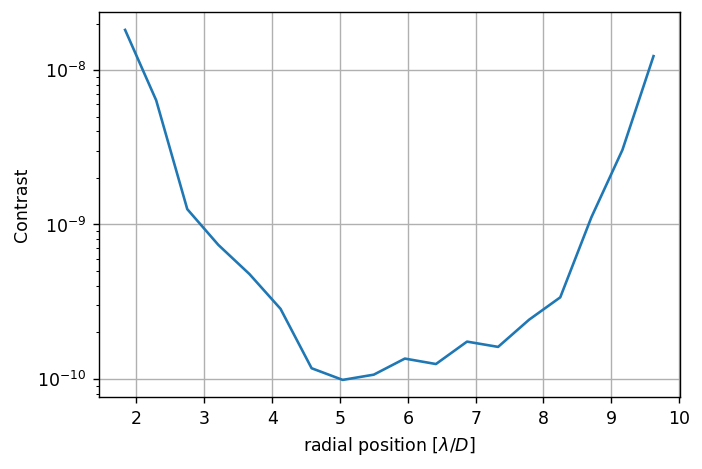

	Closed-loop iteration 7 / 10


(640,)

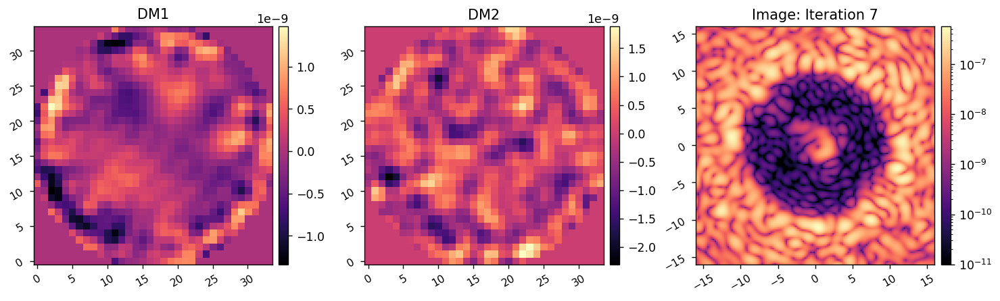

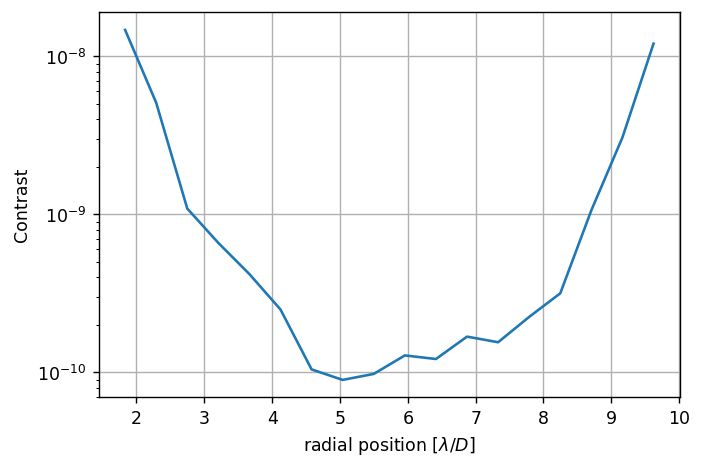

	Closed-loop iteration 8 / 10


(640,)

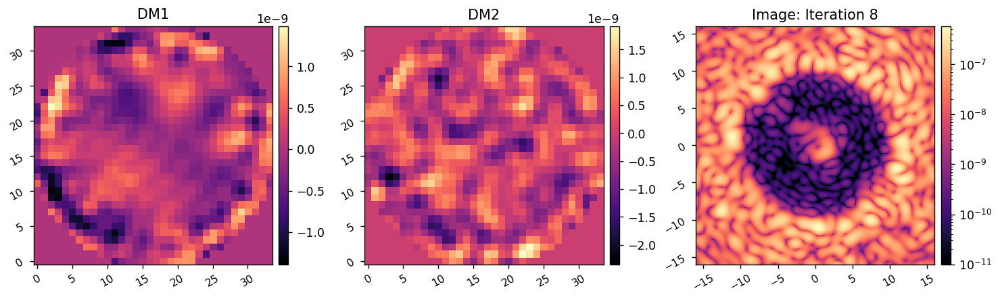

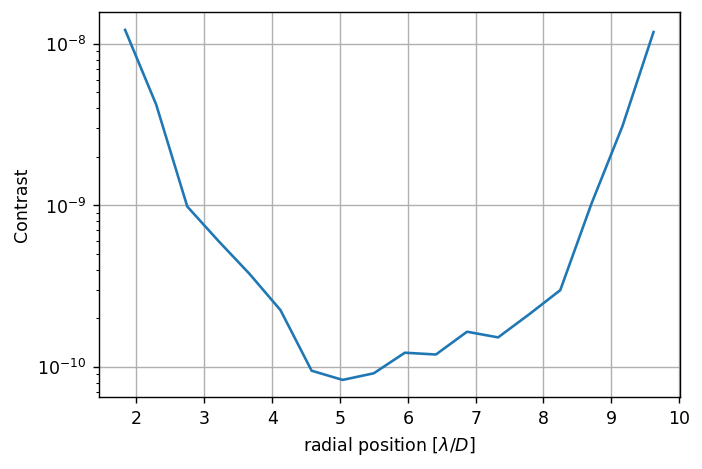

	Closed-loop iteration 9 / 10


(640,)

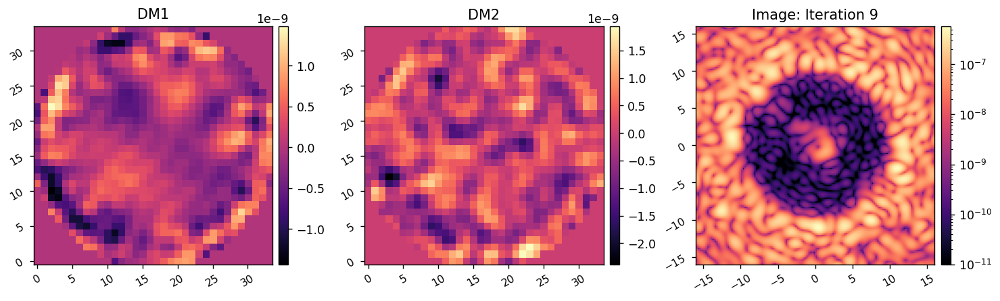

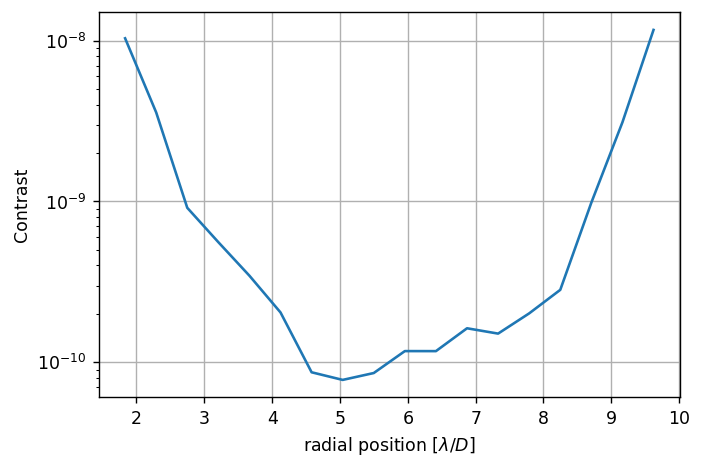

	Closed-loop iteration 10 / 10


(640,)

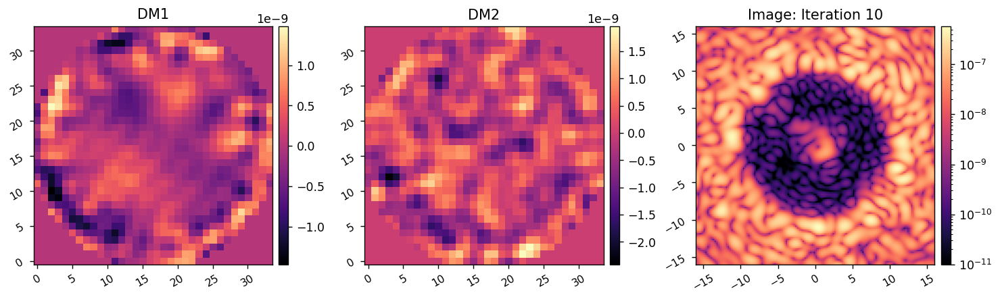

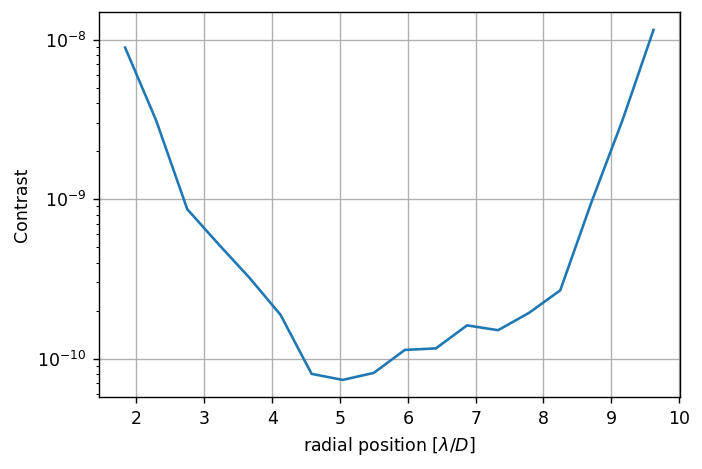

I-EFC loop completed in 42.105s.


In [23]:
reload(wfsc.iefc_2dm)
reload(wfsc.utils)

c.reset_dms()
c.use_fpm = True

reg_conds = [(1e-1,10), (1e-2, 10), (1e-3, 10)]

Wmatrix = np.diag(np.concatenate((weight_map[control_mask], weight_map[control_mask], weight_map[control_mask])))

for i in range(len(reg_conds)):
    
#     cm_tik = wfsc.utils.TikhonovInverse(response_matrix, rcond=reg_conds[i][0])
    cm_wls = wfsc.utils.WeightedLeastSquares(response_matrix, weight_map, nprobes=probe_modes.shape[0], rcond=reg_conds[i][0])
    
    images, dm1_commands, dm2_commands = wfsc.iefc_2dm.run(c, 
                                              cm_wls,
                                              probe_modes, 
                                              probe_amp, 
                                              calib_modes,
                                              control_mask, 
                                              num_iterations=reg_conds[i][1], 
                                              loop_gain=0.5, 
                                              leakage=0.0,
                                              plot_all=True,
                                             )

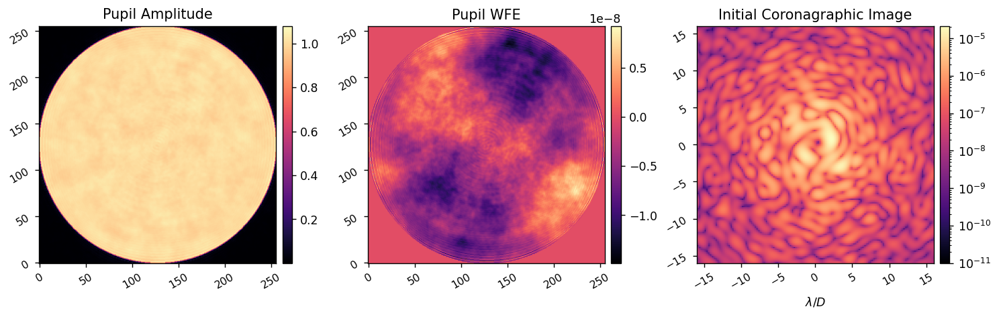

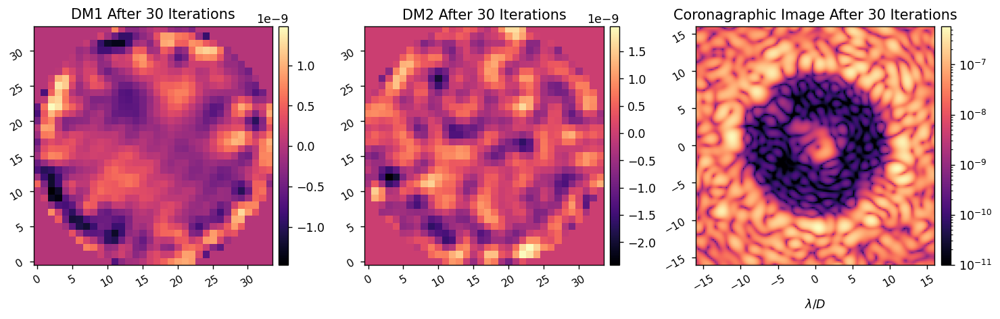

In [46]:
wfsc.imshow3(wf.amplitude.shaped, wf.phase.shaped*c.wavelength.to_value(u.m)/(2*np.pi)*pupil_mask, ref_im, 
             'Pupil Amplitude', 'Pupil WFE', 'Initial Coronagraphic Image',
             npix1=c.npix, npix2=c.npix, 
             lognorm3=True, vmin3=1e-11, xlabel3='$\lambda/D$', pxscl3=c.psf_pixelscale_lamD)
wfsc.imshow3(dm1_commands[-1], dm2_commands[-1], images[-1],
             'DM1 After 30 Iterations', 'DM2 After 30 Iterations', 'Coronagraphic Image After 30 Iterations',
             pxscl3=c.psf_pixelscale_lamD, xlabel3='$\lambda/D$', lognorm3=True, vmin3=1e-11)

In [49]:
images[-1][control_mask].mean()

1.5793826502317758e-09